In [155]:
import cv2
import matplotlib.pyplot as plt


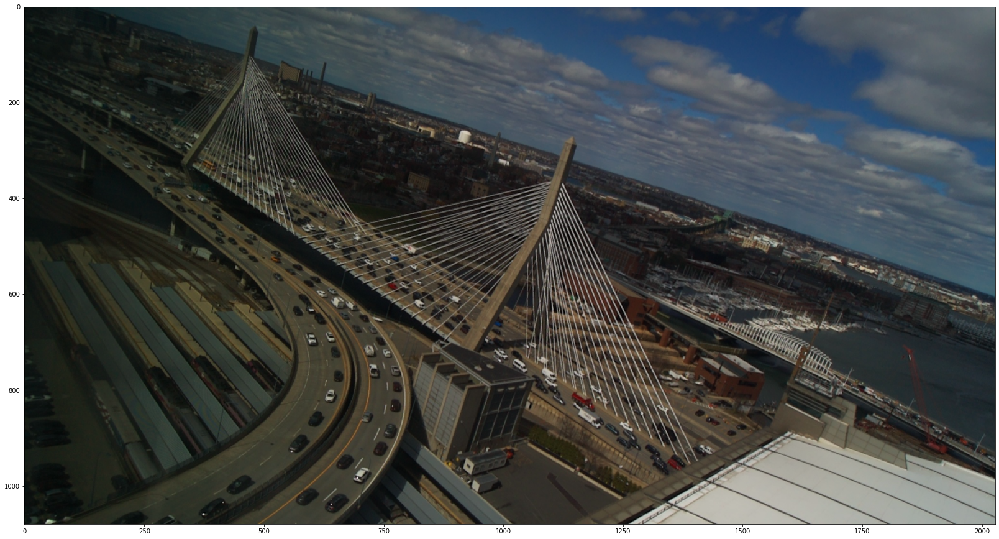

In [159]:


path = 'data/frames_1744829331345/1744829334144.jpg'

# Load the image (OpenCV loads as BGR by default)
img_bgr = cv2.imread(path)

# Convert BGR to RGB
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Show the image (still shown as BGR unless you use a custom viewer)
#img_bgr = img_bgr[600:1050,250:800]
#img_bgr = img_bgr[700:900,1000:1300]

plt.figure(figsize=(28, 26))
plt.imshow(img_bgr)
plt.show()


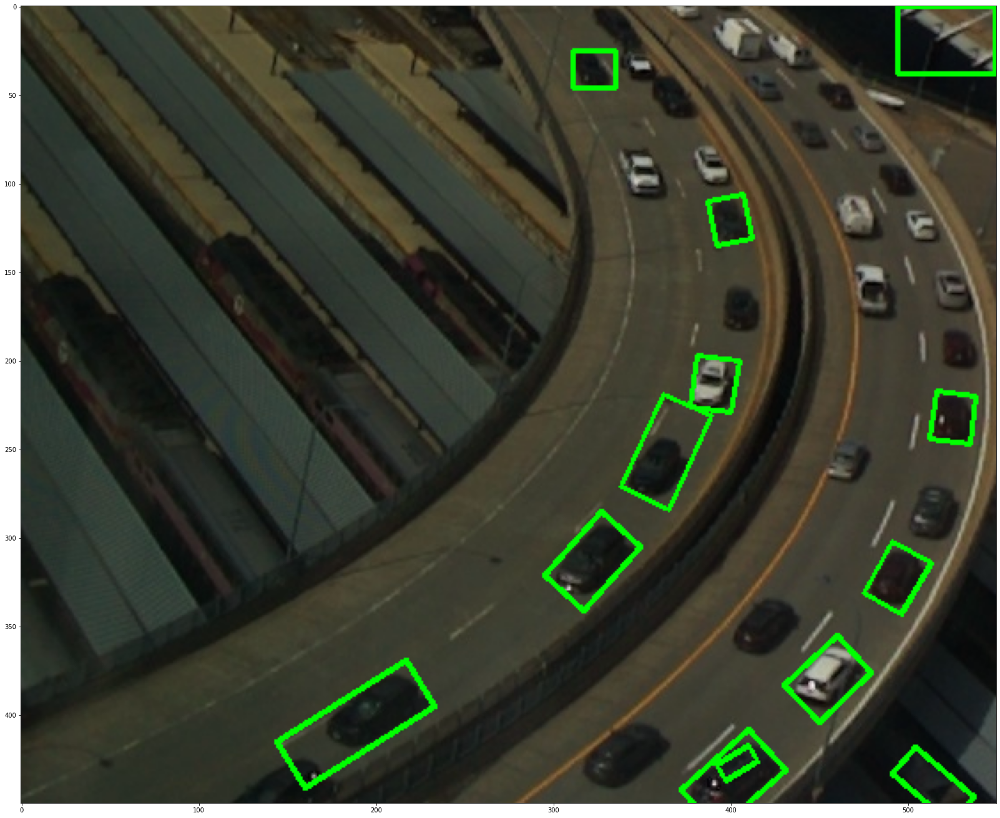

In [158]:
import cv2
import matplotlib.pyplot as plt

path = 'data/frames_1744829331345/1744837701396.jpg'
path = 'data/frames_1744829331345/1744829334144.jpg'
img_bgr = cv2.imread(path)

# Convert BGR to RGB
#img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Show the image (still shown as BGR unless you use a custom viewer)
img_bgr = img_bgr[600:1050,250:800]
# assume img_bgr is your input BGR image

# 1) Convert to grayscale
gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
blur = cv2.bilateralFilter(gray, 5, 55, 95)

edges = cv2.Canny(blur, 20, 30)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
closed = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)
contours, _ = cv2.findContours(closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

candidates = []
for cnt in contours:
    rect = cv2.minAreaRect(cnt)
    (cx,cy), (w,h), angle = rect
    if not (10 <= w <= 150 and 10 <= h <= 150): continue
    #ar = max(w,h) / min(w,h)
    #if not (0.5 < ar < 3.0): continue

    # Optional polygon check
    #peri = cv2.arcLength(cnt, True)
    #approx = cv2.approxPolyDP(cnt, 0.02 * peri, True)
    #if len(approx) != 4: continue
    #    # you might still keep it, but it's less rectangle‑like
    #    pass

    # Optional: classify
    #patch = extract_and_warp_to_upright(img, rect)
    #if classifier(patch) < 0.8:  
    #    continue

    candidates.append(rect)

# visualize
for rect in candidates:
    box = cv2.boxPoints(rect).astype(int)
    cv2.drawContours(img_bgr, [box], -1, (0,255,0), 2)


plt.figure(figsize=(28, 26))
plt.imshow(img_bgr)#cv2.cvtColor(img_bgr,cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
import os
import glob

import cv2
import torch
from PIL import Image
from torchvision.transforms import functional as F
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.rpn import AnchorGenerator





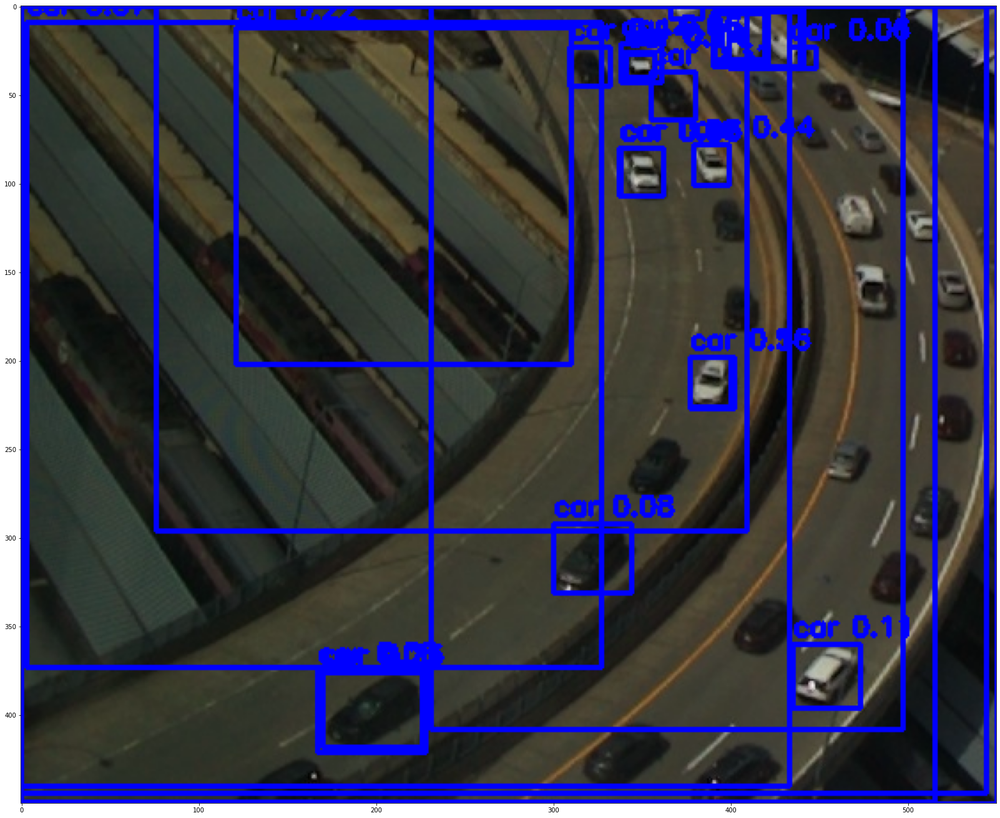

In [44]:
#path = 'car_test.png'
path = 'detected_all_objs.jpg'
# 1) Install ultralytics (if you haven’t already):
#    pip install ultralytics

model = fasterrcnn_resnet50_fpn(pretrained=True).eval()

# Read & prepare image
#img = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)

img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
tensor = F.to_tensor(img)

# Inference
with torch.no_grad():
    outputs = model([tensor])[0]

# Draw boxes for “car” (class id 3 in VOC, but 2 in COCO; check model docs)
for box, label, score in zip(outputs['boxes'], outputs['labels'], outputs['scores']):
    if int(label) > 0 and score > 0.01:  # adjust class id as needed
        x1, y1, x2, y2 = box.int().tolist()
        cv2.rectangle(img, (x1,y1), (x2,y2), (255,0,0), 2)
        cv2.putText(img, f'car {score:.2f}', (x1, y1-5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 2)
plt.figure(figsize=(28, 26))
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.show()


In [ ]:
#!/usr/bin/env python3
import cv2
import numpy as np
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2 import model_zoo
from detectron2.data import MetadataCatalog

def setup_predictor(device="cuda"):
    cfg = get_cfg()
    # Load a COCO‐panoptic‐trained Panoptic FPN
    cfg.merge_from_file(
        model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_50_3x.yaml")
    )
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
        "COCO-PanopticSegmentation/panoptic_fpn_R_50_3x.yaml"
    )
    cfg.MODEL.DEVICE = device
    # Tell Detectron2 which dataset’s metadata to use for class names
    cfg.DATASETS.TEST = ("coco_2017_val_panoptic",)
    return DefaultPredictor(cfg)

def main(
    image_path="path/to/your/image.jpg",
    road_mask_path="path/to/your/road_mask.png",
    device="cuda",
):
    # 1) Load image
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"Couldn’t load image at {image_path}")

    # 2) Load road mask (white=road, black=non‑road)
    road = cv2.imread(road_mask_path, cv2.IMREAD_GRAYSCALE)
    if road is None:
        raise FileNotFoundError(f"Couldn’t load mask at {road_mask_path}")
    # Binarize just in case
    _, road = cv2.threshold(road, 127, 255, cv2.THRESH_BINARY)
    inv_road = cv2.bitwise_not(road)

    # 3) (Optional) zero‑out road pixels so the model focuses on non‑road areas
    masked_input = cv2.bitwise_and(img, img, mask=inv_road)

    # 4) Run panoptic segmentation
    predictor = setup_predictor(device)
    outputs = predictor(masked_input)
    pan_seg, segments_info = outputs["panoptic_seg"]
    pan_seg = pan_seg.cpu().numpy()

    # 5) Grab metadata so we can map category IDs → names
    meta = MetadataCatalog.get("coco_2017_val_panoptic")

    # 6) Build a quick lookup for “road” segments
    #    stuff_classes is a list like ["wall","building",…,"road",…]
    road_id = meta.stuff_classes.index("road")
    road_segs = {
        s["id"] 
        for s in segments_info 
        if not s["isthing"] and s["category_id"] == road_id
    }
    pan_road_mask = np.isin(pan_seg, list(road_segs))

    # 7) Define which “thing” classes count as vehicles
    vehicle_names = ["car", "truck", "bus", "motorcycle"]
    vehicle_ids = [
        meta.thing_classes.index(n) 
        for n in vehicle_names 
        if n in meta.thing_classes
    ]

    # 8) Loop through each segment; if it’s a vehicle instance and not road, draw it
    for seg in segments_info:
        if not seg["isthing"] or seg["category_id"] not in vehicle_ids:
            continue

        mask = pan_seg == seg["id"]
        # Safety: skip any weird segment that overlaps the road mask
        if np.any(mask & pan_road_mask):
            continue

        ys, xs = np.where(mask)
        y1, y2 = ys.min(), ys.max()
        x1, x2 = xs.min(), xs.max()

        # Draw box + label on the original image
        cls_name = meta.thing_classes[seg["category_id"]]
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(
            img,
            cls_name,
            (x1, y1 - 6),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.5,
            (0, 255, 0),
            1,
            cv2.LINE_AA,
        )

    # 9) Display
    cv2.imshow("Detected Vehicles", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()


main(
    image_path="data/my_image.jpg",
    road_mask_path="data/road_mask.png",
    device="cuda",  # or "cpu"
)


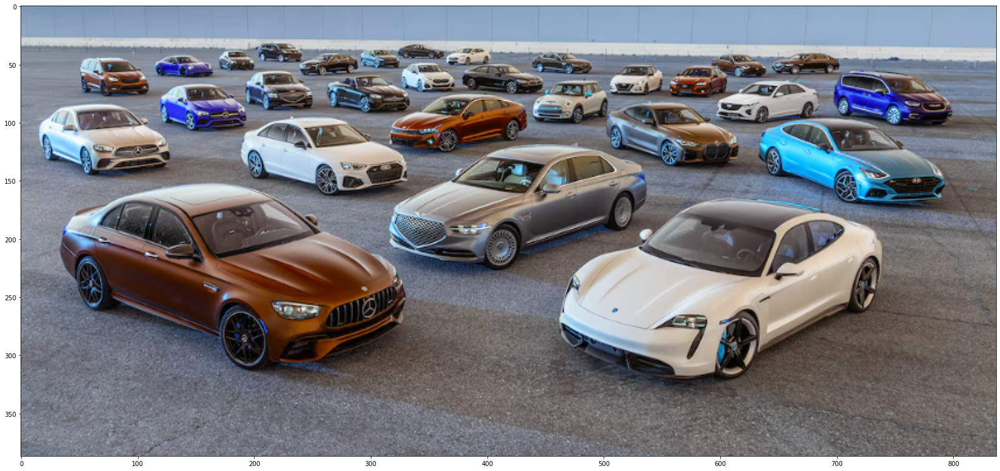

In [35]:


# ─── 5) Draw ALL detections above a confidence threshold ──────────────────
COCO_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag',
    'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite',
    'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana',
    'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table',
    'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock',
    'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

CONF_THRESH = 0.01

for box, lbl, score in zip(output['boxes'], output['labels'], output['scores']):
    if score.item() < CONF_THRESH:
        continue

    idx = lbl.item()
    # safety check
    if idx >= len(COCO_NAMES):
        cls_name = str(idx)
    else:
        cls_name = COCO_NAMES[idx]

    x1, y1, x2, y2 = map(int, box.tolist())
    cv2.rectangle(img_bgr, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(
        img_bgr,
        f"{cls_name} {score:.2f}",
        (x1, y1 - 10),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,
        (255, 255, 255),
        1
    )

plt.figure(figsize=(28, 26))
plt.imshow(img_bgr)
plt.show()


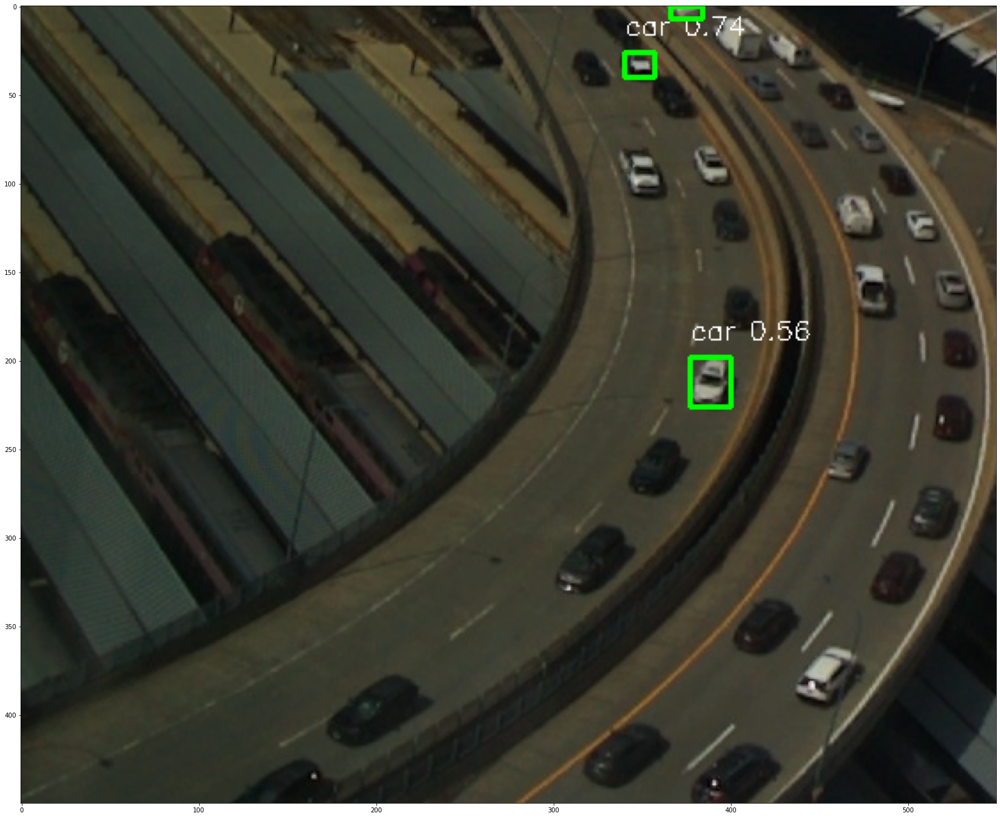

In [13]:
plt.figure(figsize=(28, 26))
plt.imshow(img_bgr)
plt.show()


In [28]:
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.rpn import AnchorGenerator

# 1) load the complete pretrained model
model = fasterrcnn_resnet50_fpn(pretrained=True)

# 2) override its anchor generator if you still want small anchors
sizes = ((16,), (32,), (64,), (128,), (256,))
aspect_ratios = ((0.5,1.0,2.0),) * len(sizes)
model.rpn.anchor_generator = AnchorGenerator(sizes=sizes, aspect_ratios=aspect_ratios)

# 3) bump its transform scales
model.transform.min_size = (1200,)   # upscale shorter side to 1200px
model.transform.max_size = 2000

model.eval().to(device)


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(1200,), max_size=2000, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU